<div style="width: 100%; clear: both;">
<div style="float: left; width: 20%;">
<img src="https://www.uoc.edu/portal/_resources/common/imatges/sala_de_premsa/noticies/2016/202-nova-marca-uoc.jpg_170798054.jpg", align="left">
</div>
<div style="float: right; width: 80%;">
<p style="margin: 0; padding-top: 22px; text-align:right;">M2.855 · Modelos avanzados de minería de datos · PEC2</p>
<p style="margin: 0; text-align:right;">2023-1 · Máster universitario en Ciencia de datos (Data science)</p>
<p style="margin: 0; text-align:right; padding-button: 100px;">Estudios de Informática, Multimedia y Telecomunicación</p>
</div>
</div>
<div style="width:100%;">&nbsp;</div>


# PEC 2: Métodos no supervisados

**Importante: la entrega debe contener el notebook (.ipynb) y su HTML tras la completa ejecución secuencial (.html) donde se pueda ver el código y los resultados. Para exportar el notebook a HTML puedes hacerlo desde el menú File → Download as → HTML.**

A lo largo de esta práctica veremos como aplicar distintas técnicas no supervisadas
así como algunas de sus aplicaciones reales:

 - **[Clustering con distintas estrategias](#ej1)**: k-means y regla del codo, basadas en densidad y jerárquicas.
 - **[Ejemplo práctico con aperturas de ajedrez](#ej2)**: reducción de dimensionalidad, clustering y análisis.

<div class="alert alert-block alert-info">
<strong>Nombre y apellidos:</strong> Gloria María Manresa Santamaría
</div>

---

Para ello vamos a necesitar las siguientes librerías:

In [1]:
import random

import tqdm
import umap
import numpy as np
import pandas as pd
import sklearn
from sklearn import cluster        # Algoritmos de clustering.
from sklearn import datasets       # Crear datasets.
from sklearn import decomposition  # Algoritmos de reduccion de dimensionalidad.

# Visualizacion.
import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px

%matplotlib inline

In [2]:
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage
from tqdm import tqdm
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import fowlkes_mallows_score
import warnings
import os
import chess
import chess.svg
from IPython.display import SVG, display


<a id="ej1"></a>

## 1. Métodos de *clustering* (4 puntos)

Este ejercicio trata de explorar distintas técnicas de agrupamiento ajustándolas a distintos conjuntos de datos.

El objetivo es doble: entender la influencia de los parámetros en su comportamiento, y conocer sus limitaciones en la búsqueda de estructuras de datos.

### Generación de los conjuntos de datos

In [3]:
X_blobs, y_blobs = datasets.make_blobs(n_samples=1000, n_features=2, centers=4, cluster_std=1.6, random_state=42)
X_moons, y_moons = datasets.make_moons(n_samples=1000, noise=.07, random_state=42)
X_circles, y_circles = datasets.make_circles(n_samples=1000, factor=.5, noise=.05, random_state=42)

Cada dataset tiene 2 variables: una variable *X* que contiene 2 features (columnas) y tantas filas como muestras. Y una variable *y* que alberga las etiquetas que identifican cada cluster.

A lo largo del ejercicio no se usará la variable *y* (sólo con el objetivo de visualizar). El objetivo es a través de los distintos modelos de *clustering* conseguir encontrar las estructuras descritas por las variables *y*.

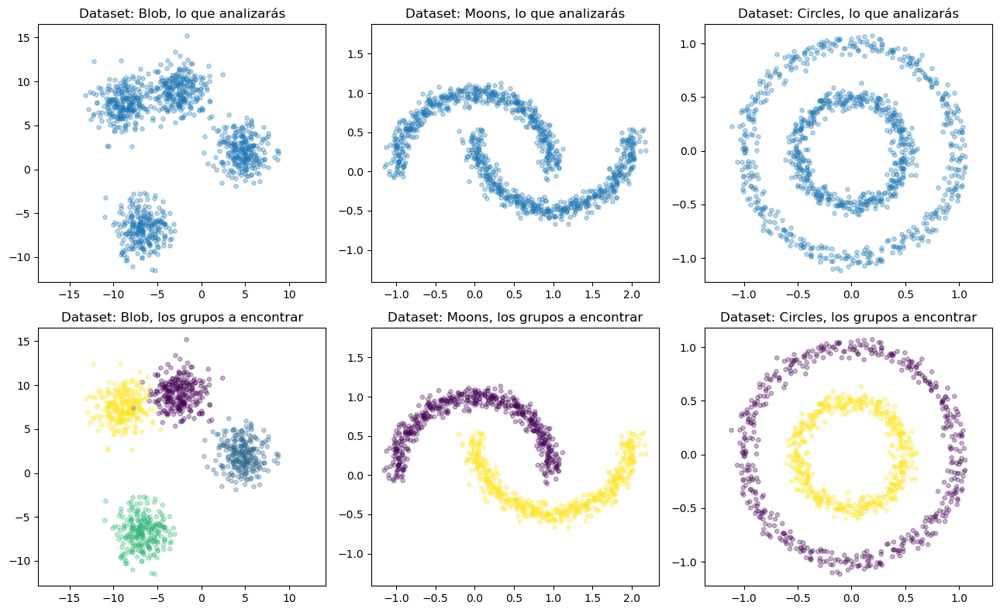

In [4]:
fig, axis = plt.subplots(2, 3, figsize=(13, 8))
for i, (X, y, ax, name) in enumerate(zip([X_blobs, X_moons, X_circles] * 2,
                                         [None] * 3 + [y_blobs, y_moons, y_circles],
                                         axis.reshape(-1),
                                         ['Blob', 'Moons', 'Circles'] * 2)):
    ax.set_title('Dataset: {}, '.format(name) + ('lo que analizarás' if i < 3 else 'los grupos a encontrar'))
    ax.scatter(X[:,0], X[:,1], s=15, c=y, alpha=.3)
    ax.axis('equal')
plt.tight_layout()

### 1 a. K-means

En este apartado se pide probar el algoritmo *k-means* sobre los tres datasets presentados anteriormente ajustando con los parámetros adecuados y analizar sus resultados.

In [5]:
X, y = X_blobs, y_blobs

Para estimar el número de clusters a detectar por *k-means*. Una técnica para estimar $k$ es, como se explica en la teoría:
> Los criterios anteriores (minimización de distancias intra grupo o maximización de distancias inter grupo) pueden usarse para establecer un valor adecuado para el parámetro k. Valores k para los que ya no se consiguen mejoras significativas en la homogeneidad interna de los segmentos o la heterogeneidad entre segmentos distintos, deberían descartarse.

Lo que popularmente se conocer como *regla del codo*.

Primero es necesario calcular la suma de los errores cuadráticos ([*SSE*](https://bl.ocks.org/rpgove/0060ff3b656618e9136b)) que consiste en la suma de todos los errores (distancia de cada punto a su centroide asignado) al cuadrado.

$$SSE = \sum_{i=1}^{K} \sum_{x \in C_i} euclidean(x, c_i)^2$$

Donde $K$ es el número de clusters a buscar por *k-means*, $x \in C_i$ son los puntos que pertenecen a i-ésimo cluster, $c_i$ es el centroide del cluster $C_i$ (al que pertenece el punto $x$), y $euclidean$ es la [distancia euclídea](https://en.wikipedia.org/wiki/Euclidean_distance).

Este procedimiento realizado para cada posible valor $k$, resulta en una función monótona decreciente, donde el eje $x$ representa los distintos valores de $k$, y el eje $y$ el $SSE$. Intuitivamente se podrá observar un significativo descenso del error, que indicará el valor idóneo de $k$.

**Se pide realizar la representación gráfica de la regla del codo junto a su interpretación, utilizando la librería ```matplotlib``` y la implementación en scikit-learn de [*k-means*](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).**

<div class="alert alert-block alert-info">
    <strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Blobs.
</div>

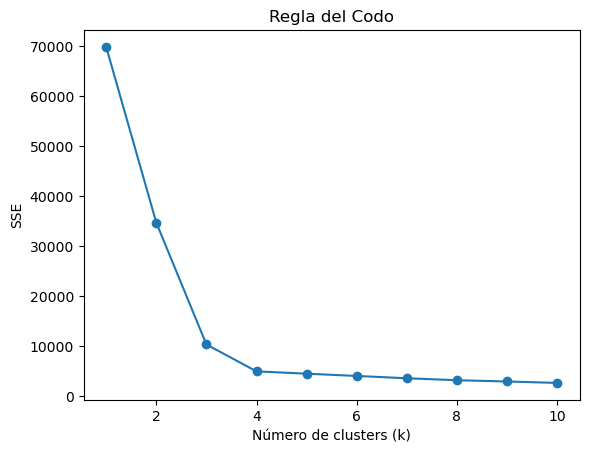

In [6]:
# Ignora las advertencias
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn.cluster._kmeans")

# Lista para almacenar los valores de SSE
SSE_values = []

# Número de clusters a probar
k_values = range(1, 11)

# Realiza el ajuste del modelo para diferentes valores de k
for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=111)
    kmeans.fit(X)
    SSE_values.append(kmeans.inertia_)

# Grafica la curva de la regla del codo
plt.plot(k_values, SSE_values, marker='o')
plt.xlabel('Número de clusters (k)')
plt.ylabel('SSE')
plt.title('Regla del Codo')
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué se interpreta en la gráfica? ¿Cómo podría mejorarse la elección de $k$?.  
</div>

Observamos que el incremento en el número de clusters deja de mejorar significativamente el SSE a partir de k=4. En el gráfico, notamos que el codo se estabiliza alrededor de este valor, indicando que la elección óptima para el número de clusters es 4.

Después de aplicar el método del codo podríamos tratar de mejorar la elección de k evaluando otros criterios como los que podrían ser aquellos que tratan la heterogeneidad entre segmentos. 

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Blobs.
</div>

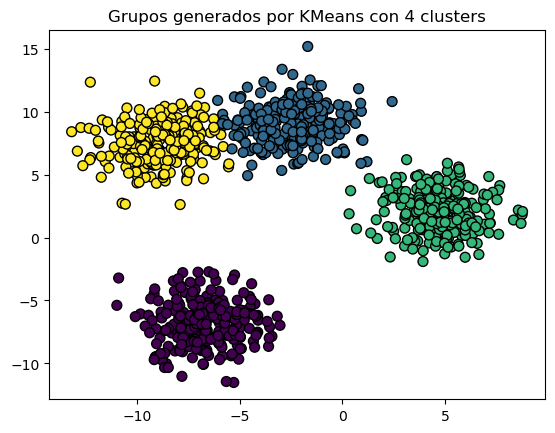

In [7]:
# Ignora las advertencias
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn.cluster._kmeans")

# Ajusta el modelo KMeans con el número óptimo de clusters
kmeans = KMeans(n_clusters=4, n_init=10, random_state=111)
kmeans.fit(X)

# Visualiza los grupos resultantes
plt.scatter(X[:, 0], X[:, 1], c=kmeans.labels_, cmap='viridis', edgecolors='k', s=50)
plt.title('Grupos generados por KMeans con 4 clusters')
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado. 
</div>

En este conjunto de datos, los cuatro clústers están bastante definidos, tienen tamaños similares y presentan formas esféricas. Por esta razón, el algoritmo k-means ha logrado distinguir con bastante precisión los clústers originales.

In [8]:
X, y = X_moons, y_moons

<div class="alert alert-block alert-info">
    <strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Moons.
</div>

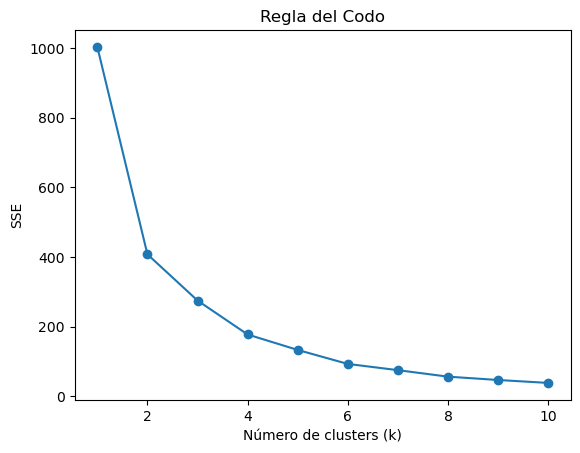

In [9]:
# Ignora las advertencias
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn.cluster._kmeans")

# Lista para almacenar los valores de SSE
SSE_values = []

# Número de clusters a probar
k_values = range(1, 11)

# Realiza el ajuste del modelo para diferentes valores de k
for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=111)
    kmeans.fit(X)
    SSE_values.append(kmeans.inertia_)

# Grafica la curva de la regla del codo
plt.plot(k_values, SSE_values, marker='o')
plt.xlabel('Número de clusters (k)')
plt.ylabel('SSE')
plt.title('Regla del Codo')
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué se interpreta en la gráfica? ¿Cómo podría mejorarse la elección de $k$?.  
</div>

En este caso la selección de k es más confusa que en el caso anterior. Observamos como la mejora del SSE es bastante gradual, lo que complica la toma de decisión basándonos únicamente en esta regla. Idealmente, se explorarían otros métodos para obtener información adicional y tomar una decisión más fundamentada.

No obstante, al analizar el comportamiento del SSE, notamos que a partir de 2 clusters no se observa una mejora significativa. Por lo que hemos optado por seleccionar k = 2.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Moons.
</div>

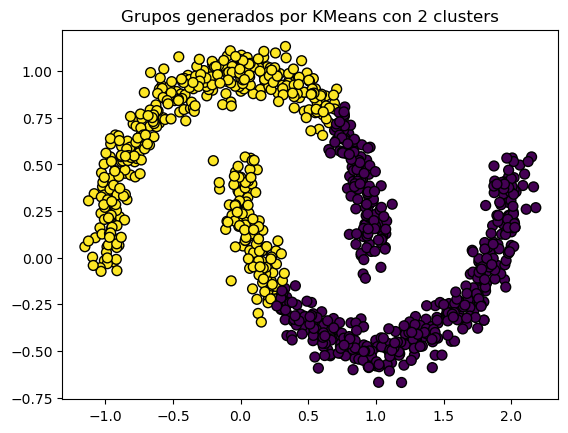

In [10]:
# Ignora las advertencias específicas que no deseas mostrar
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn.cluster._kmeans")

# Ajusta el modelo KMeans con el número óptimo de clusters
kmeans = KMeans(n_clusters=2, n_init=10, random_state=111)
kmeans.fit(X)

# Visualiza los grupos resultantes
plt.scatter(X[:, 0], X[:, 1], c=kmeans.labels_, cmap='viridis', edgecolors='k', s=50)
plt.title('Grupos generados por KMeans con 2 clusters')
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

El algoritmo k-means asigna puntos a clusters según la distancia al centroide más cercano. Por lo que en situaciones donde los clusters tienen formas no convencionales, como en este caso específico, este algoritmo no es el adecuado.

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Pregunta abierta, ¿qué tendrías que cambiar para conseguir encontrar los grupos en este conjunto de datos?
</div>

Para conjuntos de datos con estructuras más complejas, sería más apropiado emplear otro algoritmo, como DBSCAN. DBSCAN se fundamenta en la densidad de los datos para identificar clústers con formas diversas, lo que lo convierte en una elección más adecuada en este caso.

In [11]:
X, y = X_circles, y_circles

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Circles.
</div>

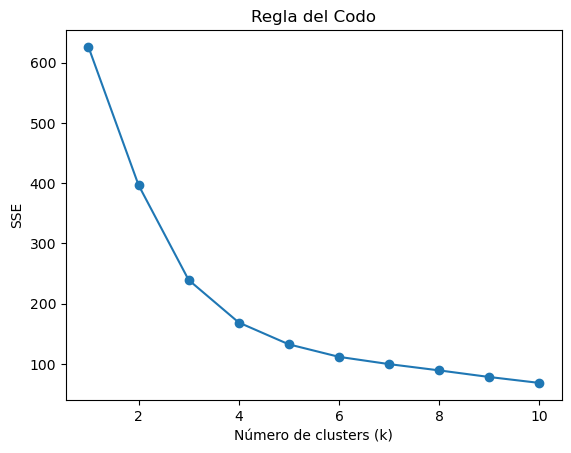

In [12]:
# Ignora las advertencias
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn.cluster._kmeans")

# Lista para almacenar los valores de SSE
SSE_values = []

# Número de clusters a probar
k_values = range(1, 11)

# Realiza el ajuste del modelo para diferentes valores de k
for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=111)
    kmeans.fit(X)
    SSE_values.append(kmeans.inertia_)

# Grafica la curva de la regla del codo
plt.plot(k_values, SSE_values, marker='o')
plt.xlabel('Número de clusters (k)')
plt.ylabel('SSE')
plt.title('Regla del Codo')
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué se interpreta en la gráfica? ¿Cómo podría mejorarse la elección de $k$?.  
</div>

En este caso observamos como la regla del codo nos llevaría, lo más seguro, a tomar una decisión incorrecta. Observamos como la curva se empieza a estabilizar en k = 3. Es poco probable que tras ver este gráfico la elección sea de k = 2, que es el número de clusters original en este caso.

La regla del codo se basa en la disminución de la variación total dentro de los clusters, pero si los clusters tienen formas complejas, como es nuestro caso, este método no funcionaría según lo esperado. En este caso sería más conveniente utilizar otro algoritmo de clustering como DBSCAN, en el que no es necesario especificar el número de clusters de antemano.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Circles.
</div>

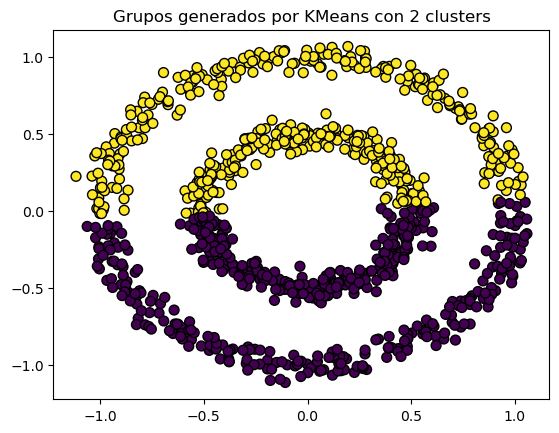

In [13]:
# Ignora las advertencias específicas que no deseas mostrar
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn.cluster._kmeans")

# Ajusta el modelo KMeans con el número óptimo de clusters
kmeans = KMeans(n_clusters=2, n_init=10, random_state=111)
kmeans.fit(X)

# Visualiza los grupos resultantes
plt.scatter(X[:, 0], X[:, 1], c=kmeans.labels_, cmap='viridis', edgecolors='k', s=50)
plt.title('Grupos generados por KMeans con 2 clusters')
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Al igual que en el escenario anterior con el conjunto de datos "moons", es evidente que el algoritmo k-means no es adecuado para manejar clusters con este tipo de formas. En este contexto, resultaría más apropiado recurrir a un algoritmo que se base en la densidad de los datos, tal como DBSCAN.

La elección de DBSCAN se justifica por su capacidad para identificar clusters según la densidad local de los puntos, sin requerir suposiciones sobre la forma de los clusters.

### 1 b. Algoritmos basados en densidad: DBSCAN

En este apartado se pide aplicar clustering por densidad como [DBSCAN](https://en.wikipedia.org/wiki/DBSCAN) a los datasets anteriores para detectar los dos grupos subyacentes.

Ésta es una visualización intuitiva de su funcionamiento: https://www.youtube.com/watch?v=RDZUdRSDOok

In [14]:
X, y = X_blobs, y_blobs

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de <a href="http://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html">DBSCAN en scikit-learn</a> jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Blobs.
</div>

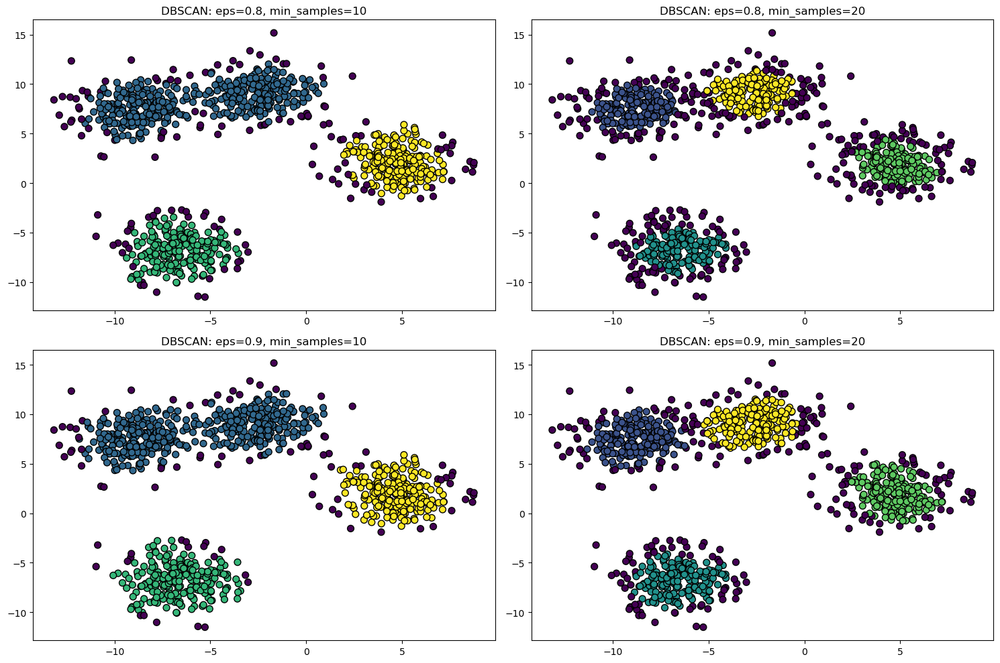

In [15]:
# DBSCAN con diferentes valores de eps y min_samples
eps_values = [0.8, 0.9]
min_samples_values = [10, 20]

plt.figure(figsize=(15, 10))

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        y_dbscan = dbscan.fit_predict(X)

        # Subgráficos para diferentes combinaciones de eps y min_samples
        plt.subplot(len(eps_values), len(min_samples_values), i * len(min_samples_values) + j + 1)
        plt.scatter(X[:, 0], X[:, 1], c=y_dbscan, cmap='viridis', edgecolors='k', s=50)
        plt.title(f'DBSCAN: eps={eps}, min_samples={min_samples}')

plt.tight_layout()
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Tras aplicar el algoritmo DBSCAN a este conjunto de datos, se observa que el resultado no es tan bueno como el obtenido con k-means. Esto se debe a que los clusters en este dataset presentan formas circulares y "separadas", lo que se ajusta bien a la suposición de k-means. Además, DBSCAN identifica un mayor número de outliers, esto se debe a a la forma en que este algoritmo identifica clusters basándose en la densidad de los datos.

In [16]:
X, y = X_moons, y_moons

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de DBSCAN jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Moons.
</div>

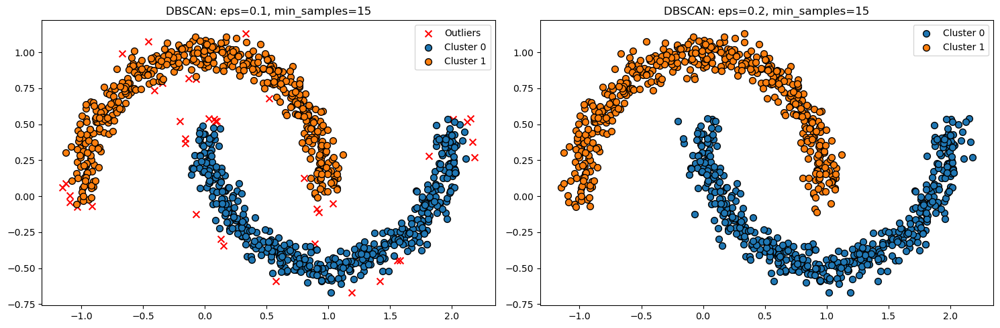

In [17]:
# Utiliza DBSCAN con diferentes valores de eps
eps_values = [0.1, 0.2]
min_samples_values = [15]

plt.figure(figsize=(15, 5))

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        y_dbscan = dbscan.fit_predict(X)

        # Subgráficos
        plt.subplot(1, 2, i + 1)
        unique_labels = np.unique(y_dbscan)
        
        for label in unique_labels:
            if label == -1:
                outliers_mask = y_dbscan == label
                plt.scatter(X[outliers_mask, 0], X[outliers_mask, 1], c='red', marker='x', s=50, label='Outliers')
            elif label != -1:
                cluster_mask = y_dbscan == label
                plt.scatter(X[cluster_mask, 0], X[cluster_mask, 1], s=50, edgecolors='k',
                            label=f'Cluster {label}')

        plt.title(f'DBSCAN: eps={eps}, min_samples={min_samples}')
        plt.legend()

plt.tight_layout()
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Observamos como, según esperabamos, éste algoritmo ha podido diferenciar los dos clusters sin problemas. 
Observamos también como afecta la elección del valor de eps, mientras que en eps=0.1 encontramos algunos outliers al aumentar eps a 0.2 el algoritmo es capaz de identificar perfectamente y sin outliers los dos clusters. Esto se debe a la distancia en la que se encuentran los puntos vecinos en este caso. Al aumentar el valor de eps, se amplía la distancia en la que el algoritmo busca puntos vecinos para formar clusters y en este caso, dada la densidad de los clusters éste es el valor óptimo.

In [18]:
X, y = X_circles, y_circles

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de DBScan jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Circles.
</div>

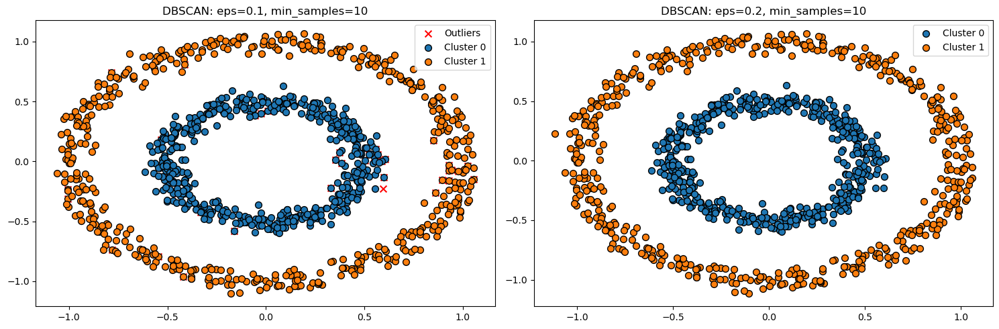

In [19]:
# Utiliza DBSCAN con diferentes valores de eps y min_samples
eps_values = [0.1, 0.2]
min_samples_values = [10]

plt.figure(figsize=(15, 5))

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        y_dbscan = dbscan.fit_predict(X)

        # Subgráficos para diferentes combinaciones de eps y min_samples
        plt.subplot(1, 2, i + 1)
        unique_labels = np.unique(y_dbscan)
        for label in unique_labels:
            if label == -1:
                otliers_mask = y_dbscan == label
                plt.scatter(X[outliers_mask, 0], X[outliers_mask, 1], c='red', marker='x', s=50, label='Outliers')
            elif label != -1:
                cluster_mask = y_dbscan == label
                plt.scatter(X[cluster_mask, 0], X[cluster_mask, 1], s=50, edgecolors='k',
                            label=f'Cluster {label}')
        plt.title(f'DBSCAN: eps={eps}, min_samples={min_samples}')
        plt.legend()

plt.tight_layout()
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Observamos como el algoritmo DBSCAN, escogiendo los valores correctos de eps y min_values, ha sido capaz de identificar perfectamente los dos clústers originales.

Con eps=0.1 observamos algunos outliers y con eps=0.2 el algoritmo ha identificado perfectamente los dos clústers sin outliers. Al igual que en el caso anterior por la forma de los clústers este algoritmo era el adecuado en este caso.

### 1 c. Algoritmos jerárquicos

En este apartado se pide visualizar mediante un [dendrograma](https://en.wikipedia.org/wiki/Dendrogram) la construcción progresiva de los grupos mediante un algoritmo jerárquico aglomerativo (estrategia *bottom-up*). Con ello se pretende encontrar un método gráfico para entender el comportamiento del algoritmo y encontrar los *clusters* deseados en cada dataset.

In [20]:
X, y = X_blobs, y_blobs

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Blobs.<br>
Puedes importar las librerías necesarias para ello.
</div>

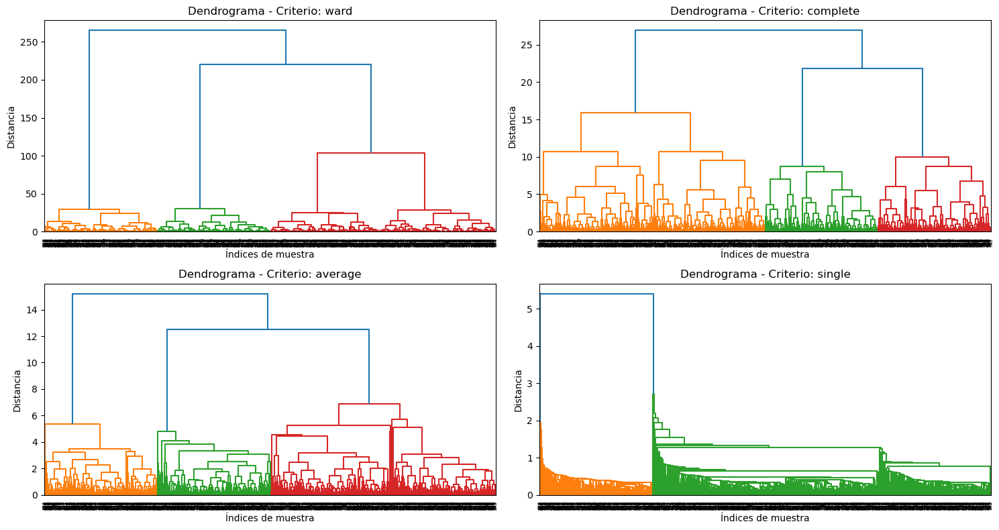

In [21]:
# Aplica el algoritmo jerárquico con distintos criterios de enlace
linkage_methods = ['ward', 'complete', 'average', 'single']

plt.figure(figsize=(15, 8))

for i, method in enumerate(linkage_methods, 1):
    plt.subplot(2, 2, i)
    
    # Calcula la matriz de enlace
    Z = linkage(X, method)
    
    # Genera el dendrograma
    dendrogram(Z)
    
    plt.title(f'Dendrograma - Criterio: {method}')
    plt.xlabel('Índices de muestra')
    plt.ylabel('Distancia')

plt.tight_layout()
plt.show()

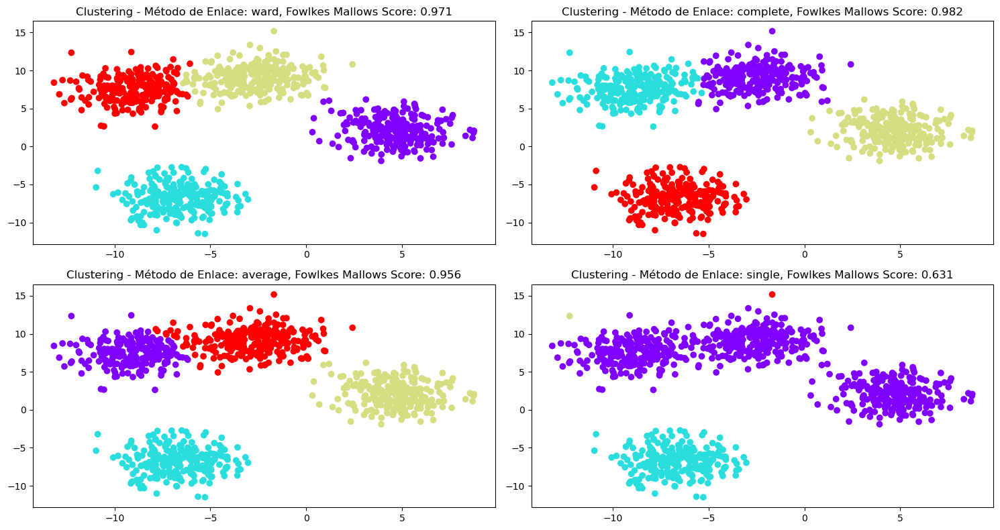

In [22]:
# Método de enlace
linkage_methods = ['ward', 'complete', 'average', 'single']

plt.figure(figsize=(15, 8))

for i, method in enumerate(linkage_methods, 1):
    plt.subplot(2, 2, i)
    
    # Crea y ajusta el modelo de clustering jerárquico aglomerativo
    cluster = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage=method)
    cluster_labels = cluster.fit_predict(X)
    
    # Calcula la medida Fowlkes-Mallows
    score = fowlkes_mallows_score(y, cluster_labels)
    
    # Gráfico
    plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='rainbow')
    
    # Etiquetas y título
    plt.title(f'Clustering - Método de Enlace: {method}, Fowlkes Mallows Score: {score:.3f}')

plt.tight_layout()
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

Observamos como el dendograma con el método de enlace "complete" es el que se ha comportado mejor. 

Aunque cabe destacar que el único que ha obtenido resultados no satisfactorios ha sido el enlace simple en el que ha ocurrido "el efecto cadena" que ha forzado la unión de tres grupos que a priori deberían permanecer separados.

In [23]:
X, y = X_moons, y_moons

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Moons.<br>
Puedes importar las librerías necesarias para ello.
</div>

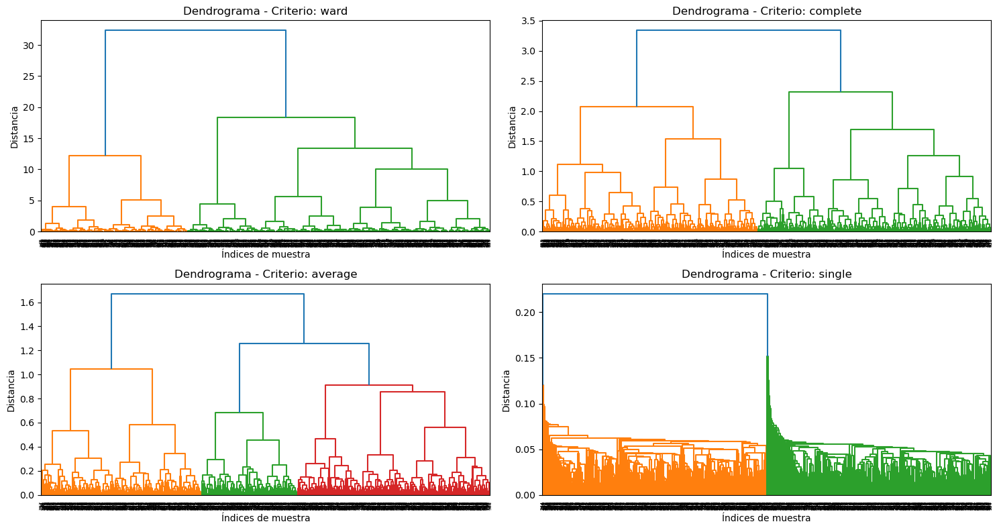

In [24]:
# Aplica el algoritmo jerárquico con distintos criterios de enlace
linkage_methods = ['ward', 'complete', 'average', 'single']

plt.figure(figsize=(15, 8))

for i, method in enumerate(linkage_methods, 1):
    plt.subplot(2, 2, i)
    
    # Calcula la matriz de enlace
    Z = linkage(X, method)
    
    # Genera el dendrograma
    dendrogram(Z)
    
    plt.title(f'Dendrograma - Criterio: {method}')
    plt.xlabel('Índices de muestra')
    plt.ylabel('Distancia')

plt.tight_layout()
plt.show()

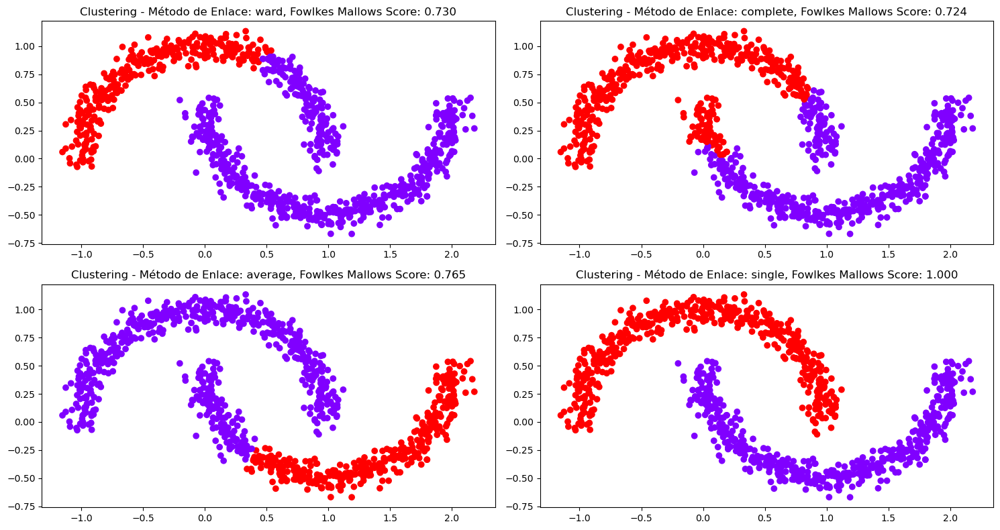

In [25]:
# Método de enlace
linkage_methods = ['ward', 'complete', 'average', 'single']

plt.figure(figsize=(15, 8))

for i, method in enumerate(linkage_methods, 1):
    plt.subplot(2, 2, i)
    
    # Crea y ajusta el modelo de clustering jerárquico aglomerativo
    cluster = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage=method)
    cluster_labels = cluster.fit_predict(X)
    
    # Calcula la medida Fowlkes-Mallows
    score = fowlkes_mallows_score(y, cluster_labels)
    
    # Gráfico
    plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='rainbow')
    
    # Etiquetas y título
    plt.title(f'Clustering - Método de Enlace: {method}, Fowlkes Mallows Score: {score:.3f}')

plt.tight_layout()
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

En este escenario particular, el método de enlace simple ha demostrado ser el más adecuado. Esta elección tiene sentido, ya que el enlace simple considera la distancia mínima entre elementos de los grupos como criterio. 

Al observar el dendrograma, se aprecia cómo los puntos cercanos se agrupan progresivamente con los más cercanos, culminando en la formación de dos clusters claramente diferenciados.

In [26]:
X, y = X_circles, y_circles

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Circles.<br>
Puedes importar las librerías necesarias para ello.
</div>

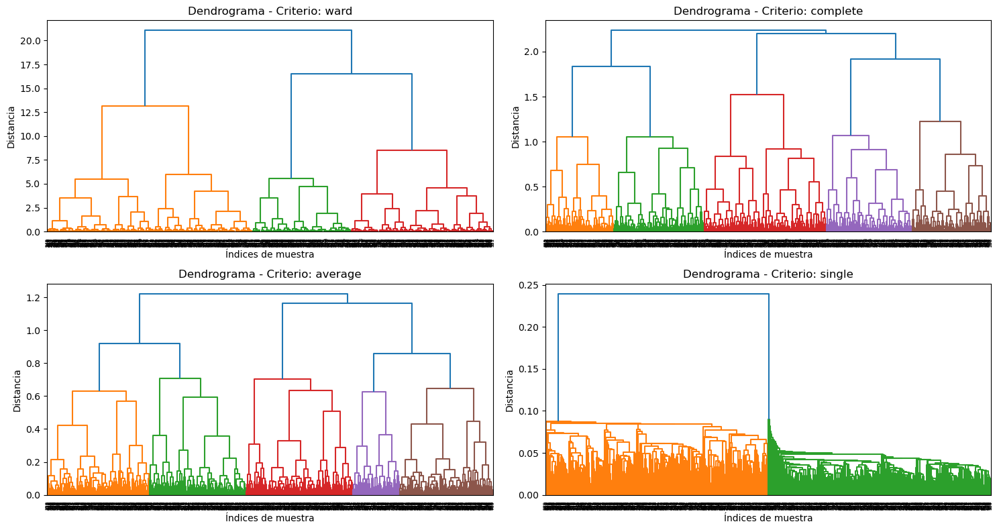

In [27]:
# Aplica el algoritmo jerárquico con distintos criterios de enlace
linkage_methods = ['ward', 'complete', 'average', 'single']

plt.figure(figsize=(15, 8))

for i, method in enumerate(linkage_methods, 1):
    plt.subplot(2, 2, i)
    
    # Calcula la matriz de enlace
    Z = linkage(X, method)
    
    # Genera el dendrograma
    dendrogram(Z)
    
    plt.title(f'Dendrograma - Criterio: {method}')
    plt.xlabel('Índices de muestra')
    plt.ylabel('Distancia')

plt.tight_layout()
plt.show()

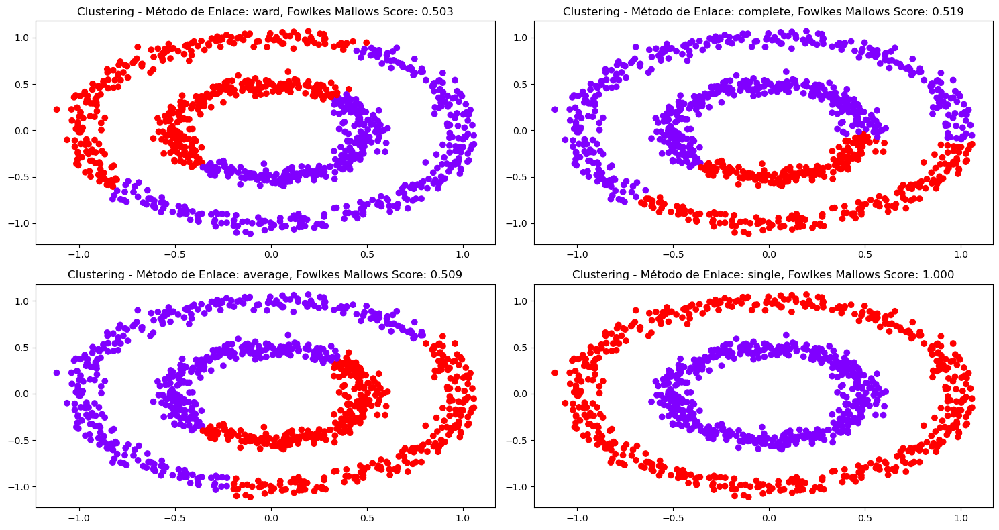

In [28]:
# Método de enlace
linkage_methods = ['ward', 'complete', 'average', 'single']

plt.figure(figsize=(15, 8))

for i, method in enumerate(linkage_methods, 1):
    plt.subplot(2, 2, i)
    
    # Crea y ajusta el modelo de clustering jerárquico aglomerativo
    cluster = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage=method)
    cluster_labels = cluster.fit_predict(X)
    
    # Calcula la medida Fowlkes-Mallows
    score = fowlkes_mallows_score(y, cluster_labels)
    
    # Gráfico
    plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='rainbow')
    
    # Etiquetas y título
    plt.title(f'Clustering - Método de Enlace: {method}, Fowlkes Mallows Score: {score:.3f}')

plt.tight_layout()
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

Al igual que en el conjunto de datos anterior (dataset "moons"), y por las mismas razones, observamos que el método de enlace simple es el más apropiado en este caso. Este enlace tiene coherencia con la estructura de los datos, ya que cada punto se agrupa con aquel que se encuentra a una distancia mínima, conduciendo eventualmente a la formación de dos clusters claramente diferenciados.

<a id="ej2"></a>

## 2. Ejemplo práctico con aperturas de ajedrez: reducción de dimensionalidad (6 puntos)

En ajedrez existen multitud de aperturas y variantes. Te permiten planificar como posicionarás tus piezas, lo cual puede otorgar una gran ventaja durante el desarrollo de la partida. Hay tantas aperturas distintas (cada una de ellas con sus variantes) que puede ser dificil situarte, como puede apreciarse en el siguiente video del Maestro FIDE [Luis Fernández](https://www.youtube.com/watch?v=soeEeadcOKw).

Como muchas aperturas se parecen a otras, porque tienen planes similares, una buena forma para ubicarse es saber cuales se parecen entre sí. Y esa es la idea de este análisis.

Partiremos de un [dataset de partidas de ajedrez](https://www.kaggle.com/datasets/datasnaek/chess) en la plataforma [lichess](https://lichess.org/), que consta de los siguientes campos (se resaltan los útiles para el análisis):

   - Game ID
   - Rated (T/F)
   - Start Time
   - End Time
   - **Number of Turns**
   - Game Status
   - Winner
   - Time Increment
   - White Player ID
   - White Player Rating
   - Black Player ID
   - Black Player Rating
   - **All Moves in Standard Chess Notation**
   - Opening Eco (código estandar de aperturas)
   - **Opening Name**
   - **Opening Ply** (número de movimientos de la apertura de la partida)

Se carga el dataset en un dataframe de pandas:

In [29]:
games = pd.read_csv('games.csv')

In [30]:
games.head(1)

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1.504210e+12,1.504210e+12,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5


### 2 a. Preparación del dato

El primer paso al tratar con dato real es analizar el dato para comprender el dominio, y aplicar determinados filtrados en base a la lógica de tu tarea.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
filtra (quédate) las partidas que tienen aperturas de 4 o más movimientos (campo opening_ply).
</div>

In [31]:
# Filtra las filas con 4 o más movimientos en opening_ply
df = games[games['opening_ply'] >= 4]

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
filtra (quédate) las partidas que tienen al menos el doble de movimientos (campo "turns") que los de la apertura (campo opening_ply).
</div>

In [32]:
# Filtra las filas con al menos el doble de movimientos que opening_ply
df = df[df['turns'] >= 2 * df['opening_ply']]

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
si el nombre de la apertura (campo opening_name) contiene el caracter "|" ignora todo el texto que le sigue.
</div>

In [33]:
# Divide el texto en opening_name en función del carácter "|"
df['opening_name'] = df['opening_name'].str.split('|').str[0]

# Elimina los espacios en blanco al principio y al final
df['opening_name'] = df['opening_name'].str.strip()

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
filtra (quédate) sólo las aperturas (por su nombre, campo opening_name) que hayan sido usadas en al menos 40 partidas. Para tener un mínimo de muestras de ese tipo, eliminando muchas aperturas apenas usadas.
</div>

In [34]:
# Calcula el conteo de cada apertura
conteo_aperturas = df['opening_name'].value_counts()

# Filtra las aperturas que han sido usadas en al menos 40 partidas
aperturas_frecuentes = conteo_aperturas[conteo_aperturas >= 40].index

# Filtra el DataFrame original para incluir solo las aperturas frecuentes
df = df[df['opening_name'].isin(aperturas_frecuentes)]

**AVISO: ¡no es necesario saber interpretar correctamente la notación algebraica para el desarrollo de la práctica!**

Los movimientos en ajedrez se pueden transcribir de distintas maneras, la más popular es la [notación algebraica](https://es.wikipedia.org/wiki/Notaci%C3%B3n_algebraica). En este caso, la notación algebraica empleada es la inglesa.

En concreto, el campo **moves** tiene los movimientos alternos tanto de las blancas como de las negras. Por tanto, la secuencia:

```e4 c5 Nf3 Qa5...```

Se interpretaría como:

 - Las blancas mueven el peón de rey a la casilla e4.
 - Las negras responden con el peón a c5.
 - Las blancas mueven el caballo (N) a la casilla f3.
 - Las negras mueven su dama a la casilla a5.
 
Y así alternan movimientos hasta el final de la partida (victoria, tablas, abandono o quedarse sin tiempo).

Es importante tener en cuenta que el campo **moves** es de tipo *string*, por lo que será necesario dividirlo por el separador (espacio) para tener cada movimiento por separado. Útil para los siguientes pasos.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
crea una columna llamada "white_moves" que contenga una lista con sólo los movimientos de la apertura del participante blanco (los impares del campo moves y tantos como indique opening_ply).
</div>

In [35]:
# Divide la columna 'moves' en una lista de movimientos
df = df.copy()
df['moves_list'] = df['moves'].str.split()

# Crea una columna 'white_moves' que contenga los movimientos del jugador blanco
df['white_moves'] = df['moves_list'].apply(lambda x: x[::2][:df['opening_ply'].values[0]])

# Elimina la columna temporal 'moves_list'
df.drop('moves_list', axis=1, inplace=True)
df.head(1)

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply,white_moves
1,l1NXvwaE,True,1.504130e+12,1.504130e+12,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4,"[d4, e4, f4, dxe5]"


Para comparar las aperturas entre sí usaremos los movimientos empleados en ella sólo por parte del jugador blanco (sólo hay nombre de la apertura del jugador blanco). Por simplicidad, podemos ignorar su orden, por lo que podemos usar la estrategia de [bag of words](https://es.wikipedia.org/wiki/Modelo_bolsa_de_palabras). Generando, a partir del campo **white_moves** un nuevo dataset con tantas dimensiones como posibles movimientos con un 1 si se ha realizado durante la apertura y un 0 si no se ha realizado.

Puedes crear nuevas columnas a partir de valores con el método [get_dummies()](https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html) de pandas.

Si el campo a partir del cual quieres generar las dimensiones es una lista de strings, [aquí](https://stackoverflow.com/questions/47786822/how-do-you-one-hot-encode-columns-with-a-list-of-strings-as-values) hay una pista.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
crea un nuevo dataframe usando el modelo bag of words a partir del campo white_moves. Puedes usar para ello el método get_dummies.
</div>

In [36]:
# Convierte la lista de movimientos en una cadena y aplica get_dummies
df_moves = df['white_moves'].apply(lambda x: '|'.join(map(str, x))).str.get_dummies(sep='|')

In [37]:
df_moves

,Ba3,Ba4,Bb2,Bb3,Bb5,Bb5+,Bc4,Bd2,Bd3,Bd5,...,exf6,f3,f4,f5,fxe5,g3,g4,gxf3,h3,h4
1,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20026,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20034,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20038,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20044,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### 2 b. Reducción de dimensionalidad

En este punto tienes un dataset con tantas filas como partidas y tantas columnas como movimientos posibles efectuados en el conjunto de datos.

El problema es que ahora dispones de muchas dimensiones, por lo que para visualizar los datos y comprobar si hay algún tipo de estructura es necesario reducir su dimensionalidad. Obteniendo un *embedding* (representación compacta) de las aperturas.

La reducción de dimensionalidad puede llevarse a cabo con métodos como PCA. Pero este método tiene la limitación de que sólo realiza proyecciones lineales. Por lo que otros métodos como [t-SNE](https://www.youtube.com/watch?v=NEaUSP4YerM) o [UMAP](https://www.youtube.com/watch?v=jth4kEvJ3P8) pueden ofrecer mejores resultados.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
reduce la dimensionalidad de los datos mediante UMAP a dos dimensiones para poder visualizarlo posteriormente.
</div>

In [38]:
np.random.seed(111)

# Reduce la dimensionalidad a dos dimensiones con UMAP
umap_reducer = umap.UMAP(n_components=2)
embedding = umap_reducer.fit_transform(df_moves)

# Crea un nuevo DataFrame con las dos dimensiones obtenidas
df_umap = pd.DataFrame(embedding, index=df_moves.index, columns=['Dimensión_1', 'Dimensión_2'])

# Muestra el DataFrame resultante
print(df_umap)

       Dimensión_1  Dimensión_2
1        -2.295912     8.530266
4        -0.794265     8.337684
8        -0.090861     0.017501
9         2.073381     6.298095
11       -2.703912    10.114997
...            ...          ...
20026    -2.334145     5.388288
20034     7.861848     6.726865
20038     7.723226     6.841675
20044    -3.123621     8.143814
20048     3.149266     7.270189

[7044 rows x 2 columns]


<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
visualiza la reducción de dimensionalidad mediante un scatter plot de la librería <strong>matplotlib</strong> donde cada punto es una muestra con coordenadas obtenidas tras la reducción de dimensionalidad para poder observar las estructuras que han emergido en el nuevo espacio.
</div>

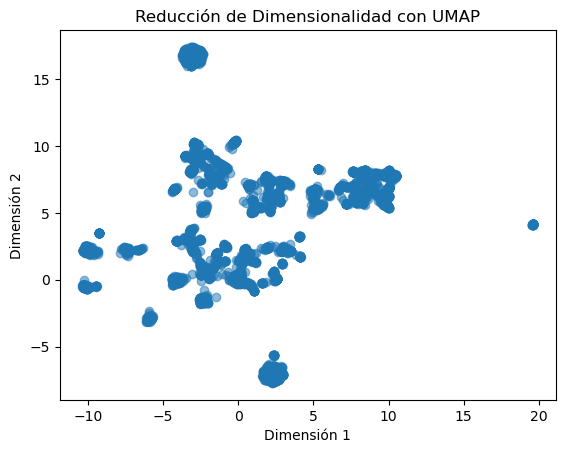

In [39]:
# Scatter plot
plt.scatter(df_umap['Dimensión_1'], df_umap['Dimensión_2'], alpha=0.5)
plt.title('Reducción de Dimensionalidad con UMAP')
plt.xlabel('Dimensión 1')
plt.ylabel('Dimensión 2')
plt.show()

<div class="alert alert-block alert-info">
<strong>Implementación opcional:</strong>
visualiza la reducción de dimensionalidad mediante un scatter plot de la librería <strong>plotly</strong>, al igual que antes, donde cada punto es una muestra con coordenadas obtenidas tras la reducción de dimensionalidad. De tal manera que al situarnos encima de cada muestra con el ratón (hovertext) nos indique el nombre de la apertura usada, para poder explorar mejor los datos.
</div>

In [40]:
# Combina las dos DataFrames
df_combined = pd.concat([df_umap, df['opening_name']], axis=1)

# Scatter plot interactivo
fig = px.scatter(df_combined, x='Dimensión_1', y='Dimensión_2', color='opening_name', 
                 hover_data=['opening_name'], title='Reducción de Dimensionalidad con UMAP')

fig.update_layout(showlegend=False)
fig.show()

### 2 c. Clustering

Tras observar la estructura de las muestras en baja dimensionalidad.

<div class="alert alert-block alert-info">
<strong>Análisis:</strong>
¿Qué método de clustering sería adecuado para detectar los distintos grupos? ¿Por qué?
</div>

A continuación utilizaremos el algoritmo de agrupación HDBScan. La elección de este método se debe a que el conjunto de datos presenta los clústeres de diferentes formas y tamaños.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
realiza el clustering con la técnica elegida para que encuentre automáticamente los grupos.
</div>

In [41]:
np.random.seed(111)

dbscan = DBSCAN(eps=0.9, min_samples=40)
clusters = dbscan.fit_predict(df_umap)

# Agrega la información de clusters al DataFrame original
df_moves['cluster'] = clusters

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
visualiza el anterior scatter plot con matplotlib (y opcionalmente con plotly) con la novedad de que el color de cada muestra se corresponda con el cluster asociado para poder observar el efecto del clustering. Utiliza una paleta de colores cualitativa (discreta) para facilitar su interpretación.
</div>

In [42]:
# Gráfico de DBSCAN
fig = px.scatter(df_umap, x='Dimensión_1', y='Dimensión_2', color=clusters,
                 title='DBSCAN Clustering con las dimensiones obtenidas en UMAP', labels={'color': 'Clusters'},
                 color_continuous_scale='turbo')

fig.update_layout(legend_title='Clusters')

fig.show()

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
para cada cluster, visualiza un gráfico de barras donde cada barra sea una de las aperturas que aparecen en el cluster y su tamaño se corresponda con el número de muestras dentro de ese grupo que han realizado esa apertura. Como consejo, puedes usar matplotlib o incluso pandas. También puede ser útil graficar con barras horizontales en lugar de verticales para facilitar su lectura.
</div>

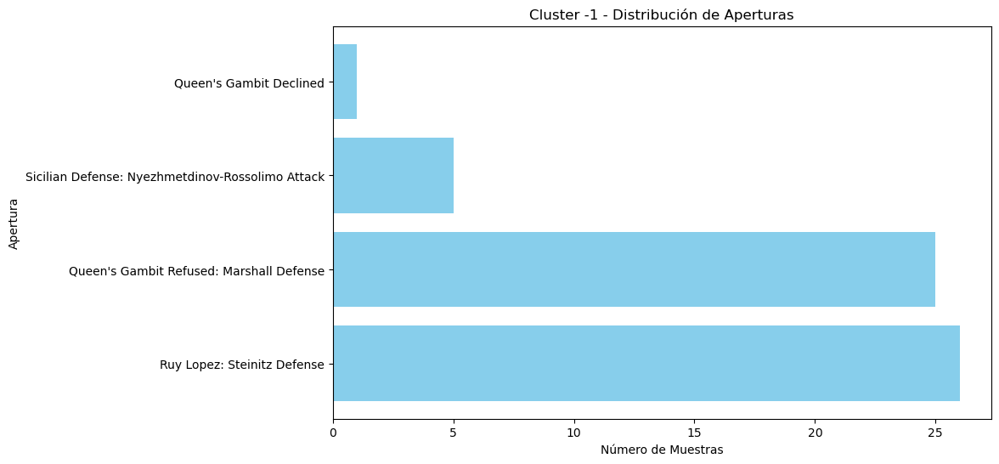

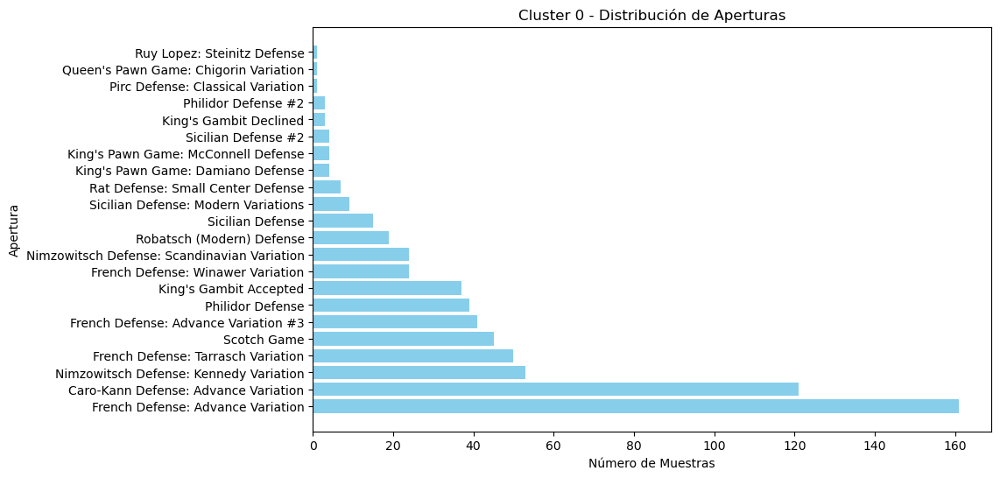

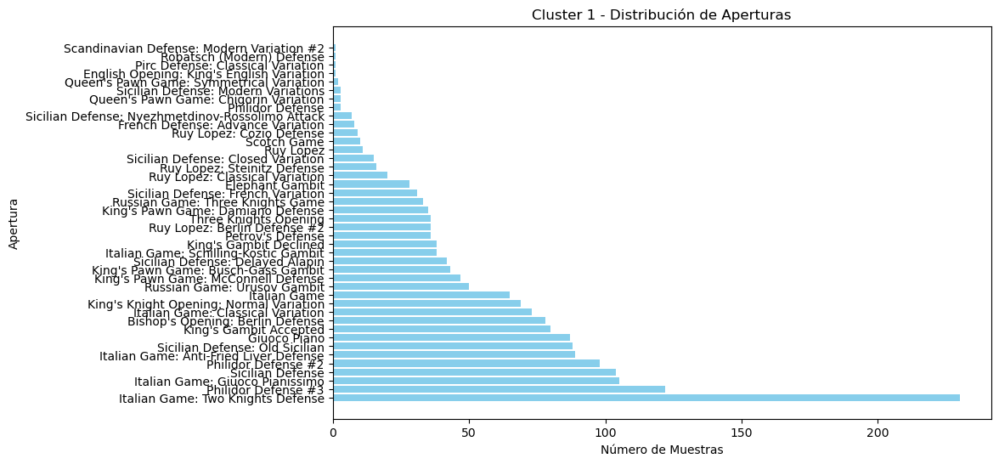

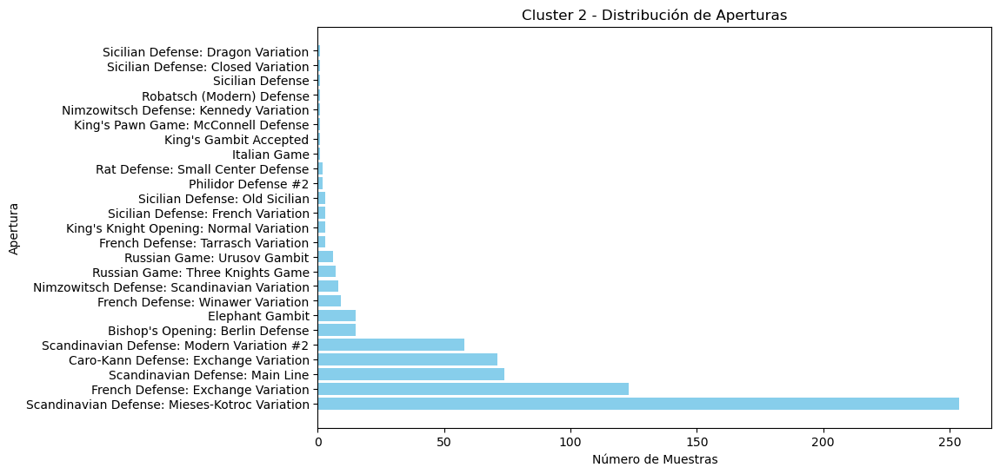

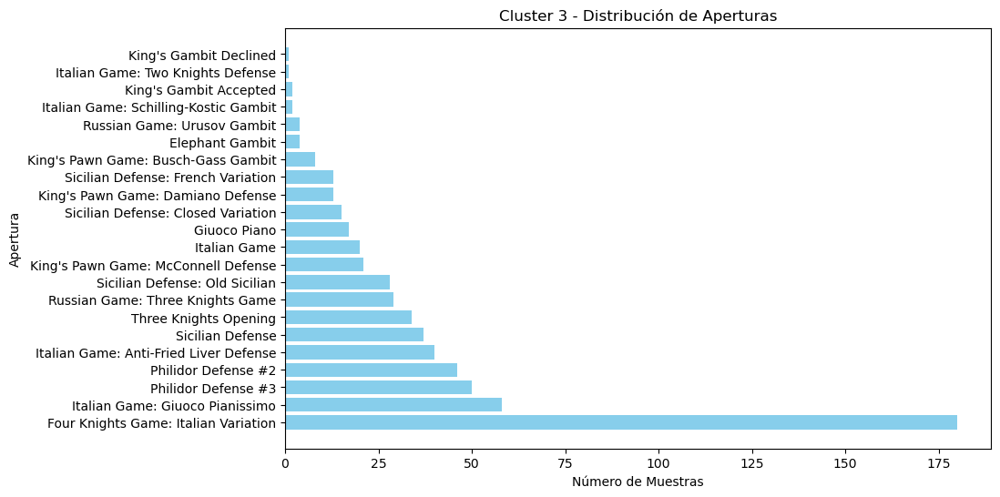

...

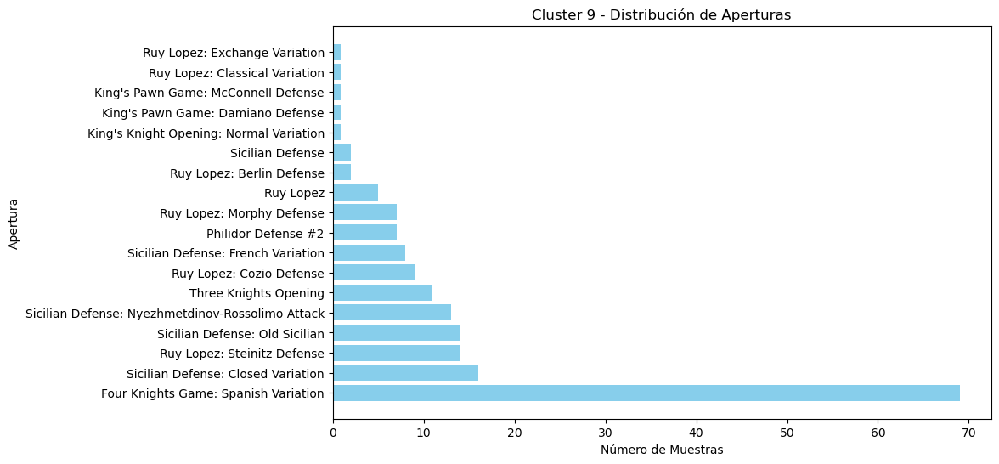

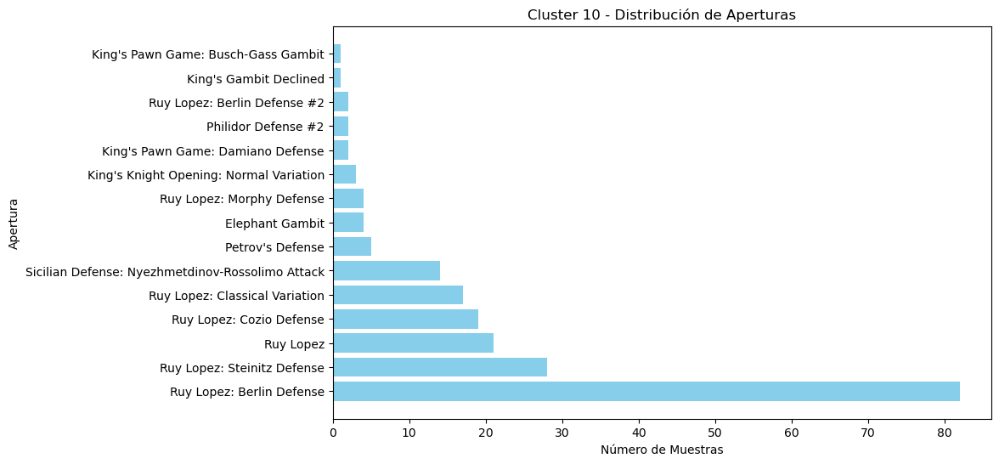

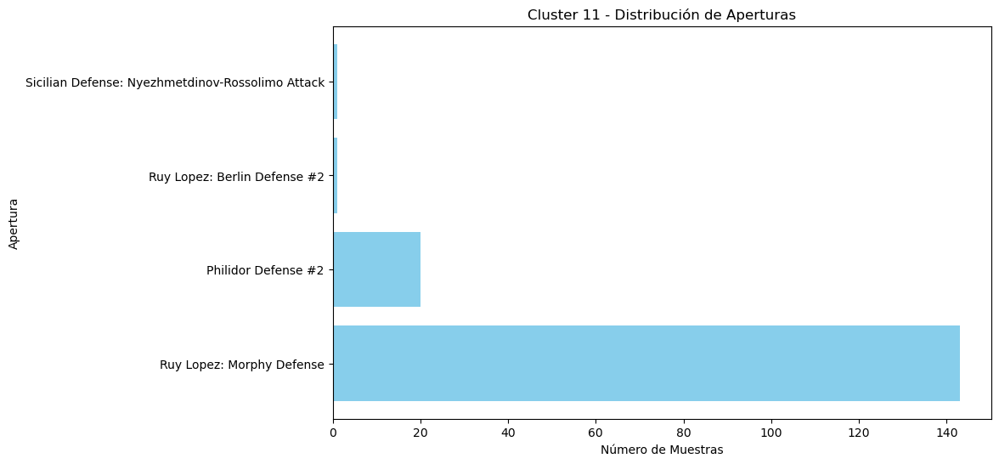

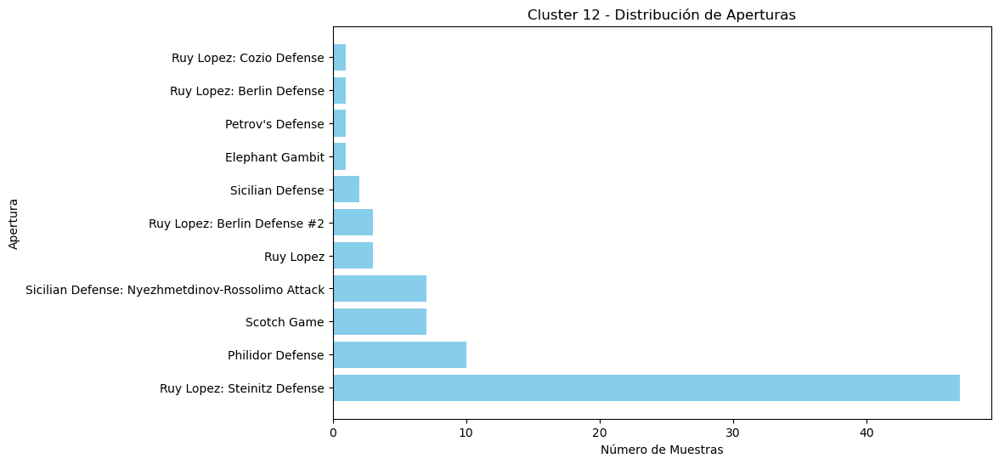

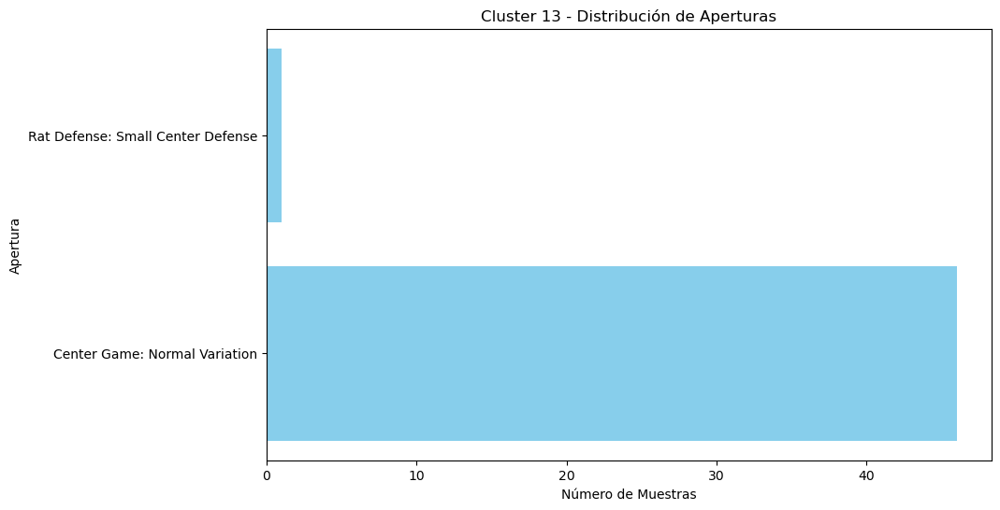

In [43]:
np.random.seed(111)

# Resetear índices
df_moves.reset_index(drop=True, inplace=True)
df.reset_index(drop=True, inplace=True)

# Fusiona los DataFrames para obtener la información de opening_name en df_moves
df_moves = pd.merge(df_moves, df[['opening_name']], left_index=True, right_index=True)

# Cuenta el número de muestras en cada apertura dentro de cada cluster
cluster_counts = df_moves.groupby(['cluster', 'opening_name']).size().reset_index(name='count')

# Ordena el DataFrame por 'count'
cluster_counts = cluster_counts.sort_values(by=['cluster', 'count'], ascending=[True, False])

# Visualiza el gráfico de barras
for cluster_id in cluster_counts['cluster'].unique():
    cluster_data = cluster_counts[cluster_counts['cluster'] == cluster_id]
    
    plt.figure(figsize=(10, 6))
    
    # Ordena las barras en función del número de muestras
    plt.barh(cluster_data['opening_name'], cluster_data['count'], color='skyblue')
    
    plt.xlabel('Número de Muestras')
    plt.ylabel('Apertura')
    plt.title(f'Cluster {cluster_id} - Distribución de Aperturas')
    
    plt.show()


### 2 d. Análisis

Una manera habitual de comparar variables (en este caso aperturas) es emplear una matriz de distancias. Donde podemos representar cuál es la distancia mínima, media o máxima entre dos aperturas.

Dado que cada apertura tiene distintas muestras (al menos 40). Si usamos el mínimo y tuviésemos 5 muestras de la apertura A y 3 de la B. La distancia entre las aperturas A y B sería la mínima de las 15 distancias posibles que hay entre las 5 muestras de A y las 3 de B.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
calcula y visualiza la distancia (euclídea en este caso) entre todas las aperturas mediante una matriz de distancias usando plotly o seaborn (mediante un heatmap). El proceso de cálculo puede llevar mucho tiempo. Se recomienda calcular la distancia entre las muestras en baja dimensionalidad usando la librería numpy empleando la normal tras la resta de las muestras. Si aún así se dilata en el tiempo puedes probar a realizar sampling aleatorio del dataset para reducir el número de muestras. Peinsa que la matriz de distancia tiene bastantes simetrías que pueden ser aprovechadas para ahorrar cálculos. Puedes utilizar tqdm para visualizar y estimar la duración del proceso de cálculo.
</div>

In [44]:
# Función para calcular la distancia euclidiana entre dos puntos
def euclidean_distance(point1, point2):
    return np.linalg.norm(point1 - point2)

# Función para calcular la matriz de distancias
def calculate_distance_matrix(data):
    num_samples = len(data)
    distance_matrix = np.zeros((num_samples, num_samples))

    for i in tqdm(range(num_samples)):
        for j in range(i, num_samples):  # Aprovechamos la simetría de la matriz
            distance_matrix[i, j] = euclidean_distance(data[i], data[j])
            distance_matrix[j, i] = distance_matrix[i, j]  # Simetría

    return distance_matrix

# Obtén las dimensiones y nombres de las aperturas
dimensions = df_combined[['Dimensión_1', 'Dimensión_2']].values
opening_names = df_combined['opening_name'].values

# Calcula la matriz de distancias
distance_matrix = calculate_distance_matrix(dimensions)

# Crea un DataFrame con la matriz de distancias
df_distances = pd.DataFrame(distance_matrix, columns=opening_names, index=opening_names)


100%|██████████| 7044/7044 [01:16<00:00, 92.61it/s] 


In [45]:
df_distances

,Nimzowitsch Defense: Kennedy Variation,Philidor Defense,Italian Game: Schilling-Kostic Gambit,Scandinavian Defense: Mieses-Kotroc Variation,French Defense: Advance Variation,Four Knights Game: Italian Variation,Italian Game: Two Knights Defense,Four Knights Game: Italian Variation,Four Knights Game: Italian Variation,Philidor Defense #3,...,Italian Game: Classical Variation,Italian Game: Classical Variation,Italian Game: Two Knights Defense,Sicilian Defense: Najdorf Variation,Sicilian Defense: Najdorf Variation,Sicilian Defense,English Opening: King's English Variation,English Opening: King's English Variation,French Defense: Advance Variation #3,French Defense: Exchange Variation
Nimzowitsch Defense: Kennedy Variation,0.000000,1.513946,8.793715,4.906456,1.636410,16.392212,9.919938,16.628962,16.040831,8.621765,...,3.188191,6.376038,10.088698,8.131229,8.563913,3.142210,10.316606,10.160437,0.913481,5.589075
Philidor Defense,1.513946,0.000000,8.349864,3.518994,2.608753,15.875029,9.841344,16.085230,15.500758,8.144943,...,3.318849,6.535758,10.009303,8.556182,8.967719,3.327185,8.804717,8.647873,2.337409,4.085459
Italian Game: Schilling-Kostic Gambit,8.793715,8.349864,0.000000,6.643027,10.430122,7.599727,2.608969,7.843196,7.254870,0.270730,...,5.736936,3.660288,2.709800,16.852839,17.274933,5.820454,10.404861,10.374454,8.673788,7.943545
Scandinavian Defense: Mieses-Kotroc Variation,4.906456,3.518994,6.643027,0.000000,6.114839,13.588726,8.838649,13.739553,13.176731,6.383700,...,4.402853,6.548425,8.989450,11.457684,11.829190,4.500448,5.804326,5.675934,5.515026,1.449998
French Defense: Advance Variation,1.636410,2.608753,10.430122,6.114839,0.000000,18.028500,11.512188,18.264669,17.676584,10.257728,...,4.796135,7.924957,11.680579,6.529068,6.965291,4.741149,11.095707,10.928853,2.015370,6.507888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sicilian Defense,3.142210,3.327185,5.820454,4.500448,4.741149,13.397381,6.778115,13.652889,13.065059,5.681765,...,0.118585,3.266802,6.946830,11.266042,11.700443,0.000000,10.283485,10.161842,2.866390,5.797357
English Opening: King's English Variation,10.316606,8.804717,10.404861,5.804326,11.095707,15.195559,12.995912,15.203147,14.750469,10.142962,...,10.180959,11.797871,13.107759,14.599219,14.856575,10.283485,0.000000,0.179993,11.076475,4.743800
English Opening: King's English Variation,10.160437,8.647873,10.374454,5.675934,10.928853,15.248918,12.960552,15.260750,14.803812,10.111408,...,10.060104,11.715041,13.074105,14.419501,14.677155,10.161842,0.179993,0.000000,10.924727,4.593989
French Defense: Advance Variation #3,0.913481,2.337409,8.673788,5.515026,2.015370,16.260820,9.570050,16.513386,15.925294,8.524673,...,2.941684,5.947705,9.737543,8.502824,8.941994,2.866390,11.076475,10.924727,0.000000,6.333429


In [46]:
# Calcular la distancia media para cada par de apertura.

stacked_distances = df_distances.stack()
mean_distances = stacked_distances.groupby(level=[0, 1]).mean().unstack()

# Heatmap
fig = px.imshow(mean_distances.values,
                labels=dict(x="Aperturas", y="Aperturas", color="Distancia Media"),
                x=mean_distances.index,
                y=mean_distances.columns,
                color_continuous_scale='Viridis')

# Ajusta el tamaño de la fuente
fig.update_xaxes(tickangle=-45, tickfont=dict(size=8))
fig.update_yaxes(tickfont=dict(size=8))

# Ajusta el tamaño de la figura
fig.update_layout(title_text='Distancia media entre aperturas', width=1000, height=850)

# Muestra la visualización
fig.show()

In [47]:
# Calcular la distancia mínima para cada par de apertura.
stacked_distances = df_distances.stack()
min_distances = stacked_distances.groupby(level=[0, 1]).min().unstack()

# Heatmap
fig = px.imshow(min_distances.values,
                labels=dict(x="Aperturas", y="Aperturas", color="Distancia Mínima"),
                x=min_distances.index,
                y=min_distances.columns,
                color_continuous_scale='Viridis')

# Ajusta el tamaño de la fuente
fig.update_xaxes(tickangle=-45, tickfont=dict(size=8))
fig.update_yaxes(tickfont=dict(size=8))

# Ajusta el tamaño de la figura
fig.update_layout(title_text='Distancia mínima entre aperturas', width=1000, height=850)

# Muestra la visualización
fig.show()

In [48]:
# Calcular la distancia máxima para cada par de apertura.
stacked_distances = df_distances.stack()
max_distances = stacked_distances.groupby(level=[0, 1]).max().unstack()

# Heatmap
fig = px.imshow(max_distances.values,
                labels=dict(x="Aperturas", y="Aperturas", color="Distancia Máxima"),
                x=max_distances.index,
                y=max_distances.columns,
                color_continuous_scale='Viridis')

# Ajusta el tamaño de la fuente
fig.update_xaxes(tickangle=-45, tickfont=dict(size=8))
fig.update_yaxes(tickfont=dict(size=8))

# Ajusta el tamaño de la figura
fig.update_layout(title_text='Distancia máxima entre aperturas', width=1000, height=850)

# Muestra la visualización
fig.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong>
Argumenta las conclusiones obtenidas tras interpretar las visualizaciones de los puntos anteriores: estructura de las muestras en baja dimensionalidad, clustering, gráficos de la dominancia de las aperturas contenidas en cada cluster y la matriz de distancias.
</div>

Después de aplicar la reducción de dimensionalidad mediante el método UMAP y analizar la visualización que muestra la apertura de cada punto, observamos que no hay un patrón claro y definido de las 77 aperturas en relación con las dos dimensiones obtenidas de UMAP.

El método de clustering empleado ha sido DBSCAN, éste ha agrupado los puntos en 14 clústeres (aperturas), más outliers.  Se podría haber ajustado el valor de eps para obtener más clústeres y acercarnos así a las 77 aperturas originales. La elección de estos parámetros se hizo con el objetivo de simplificar el análisis de los clústeres resultantes. De esta manera podremos estudiar las distancias entre las aperturas que se encuentran en un mismo clúster.

Se han realizado tres gráficos que muestran las distancias media, mínima y máxima para cada par de aperturas. En éstos podemos observar, por ejemplo, como la apertura “Center Game: Normal Variation” presenta una distancia media bastante alta en comparación con el resto de aperturas. Si comparamos esta información con los clusters obtenidos a raíz de DBSCAN observamos que el cluster número 13, es el único que presenta únicamente dos aperturas y todas menos una se trata de la apertura “Center Game: Normal Variation”. Esto indica que debido a la distancia de esta apertura con respecto al resto, el algoritmo ha logrado diferenciar con relativa facilidad las 46 partidas con esta apertura específica en un conjunto de datos relativamente grande.

In [49]:
# Número de partidas con la apertura 'Center Game: Normal Variation' en el dataset original.

sum(df['opening_name']=='Center Game: Normal Variation')

46

In [52]:
# Número de aperturas en el cluster número 13 de DBSCAN.

cluster_counts[cluster_counts['cluster'] == 13]

,cluster,opening_name,count
261,13,Center Game: Normal Variation,46
262,13,Rat Defense: Small Center Defense,1


### 2 e. OPCIONAL

Para comprender mejor lo analizado, puedes visualizar las aperturas de las muestras mediante la librería **chess** que facilita mucho la tarea.

Para ello selecciona una muestra (más fácil) o un tipo de apertura, y de la columna *moves* selecciona 2 * *opening_ply* movimientos de la apertura (el x2 es para coger los de las blancas y las negras). Una vez que ya los tengas puedes crear un tablero con la librería chess:

```board = chess.Board()```

Tras ello, simplemente itera por esos primeros y pásaselos al tablero mediante el método ```push_san``` con:

```board.push_san('d4')```

hasta agotar los movimientos **SOLO de la apertura** de blancas y negras en el mismo orden en el que ya aparecen en el campo *moves*.

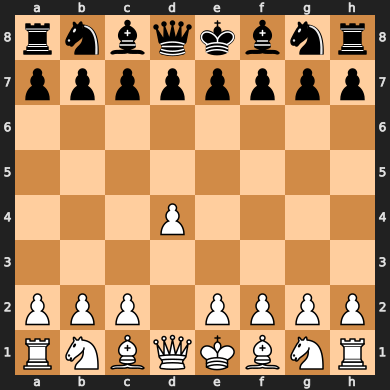

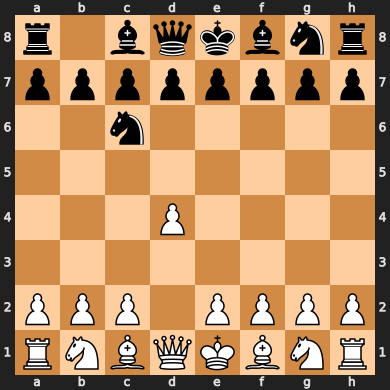

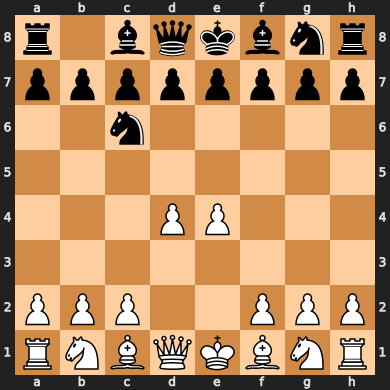

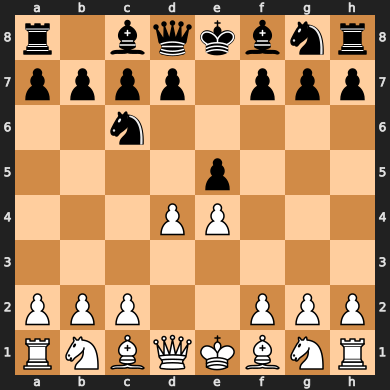

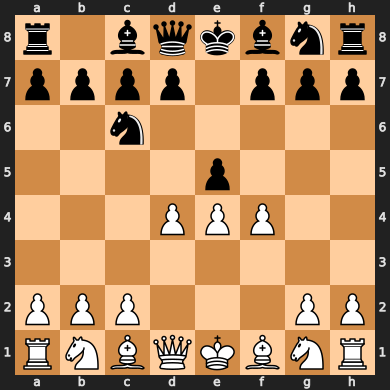

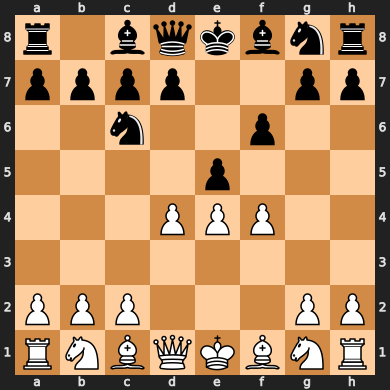

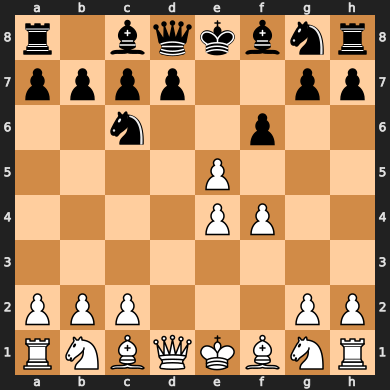

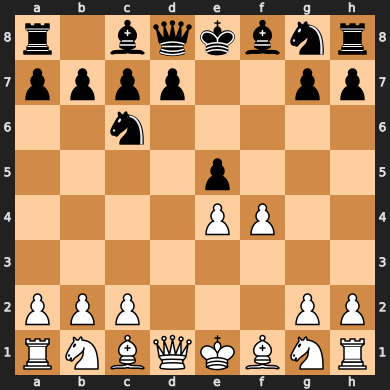

In [51]:
# Selecciona una muestra
sample_opening = df.head(1)

# Movimientos de la apertura seleccionada
movements = sample_opening['moves'].iloc[0].split()[:2 * sample_opening['opening_ply'].iloc[0]]

# Tablero de ajedrez
board = chess.Board()

for move in movements:
    
    board.push_san(move)
    display(SVG(chess.svg.board(board=board)))
    